![headline image](images/background5.png)

<br><br><center><b><font size="6">Modeling and Forecasting Crime Rate in Colorado </font></b></center>

<br><br><span style="color:black; font-size:1.5em">**Data Science Capstone Project, putting it all together**</span><br>
* Student name: <b>Elena Kazakova</b>
* Student pace: <b>Full-time</b>
* Cohort: <b>DS02222021</b>
* Scheduled project review date: <span style="color:red"><b>07/26/2021</b></span>
* Instructor name: <b>James Irving</b>
* Application url: <span style="color:red"><b>TBD</b></span>


<br><br><left><b><font size="5">TABLE OF CONTENTS </font></b></left><br>


- **[Introduction](#Introduction)<br>**
- **[Obtain](#Obtain)**<br>
- **[Explore](#Explore)<br>**
- **[Model and Interpret](#Model&iNterpret)**<br>
- **[Conclusions](#Conclusions)<br>**
- **[Recommendation](#Recommendations)**<br>


# Introduction

## Outline of the Project

<span style="color:black; font-size:1.2em">This project aims to provide transparency, create easier access, and expand awareness of criminal data both for general and categorical crime, improve resources allocation for law enforcement, and provide a foundation to help shape public policy and preventive measures with the result of a safer state. Understanding crime trends and demographics is essential to addressing the underlying reasons for criminal offenses. Visualization of existing data/forecasted trends is a vital tool for exploring and understanding crime data. The ultimate intention is to create a public-facing dashboard with the original data visualized in an easily understandable and interactive form, along with the results of the massive modeling part of this project.</span><br><br>

## Description of sub-notebooks

<span style="color:black; font-size:1.2em">It is the main notebook for the Capstone Project, Crime in Colorado. It combines all the information about the project while separate notebook have code addressing sections of the project. The parts can be found in the following notebooks:<br><br>
    1. [Part I](capstone_sql_cleanup.ipynb), creation of SQLite database with the original data, preprocessing the data in the databases' tables and building DataFrames, SQL part.<br>
    2. [Part II](capstone_project_cleanup_EDA.ipynb), preprocessing of the data in DataFrames and EDA.<br>
    3. [Part III](capstone_project_general_crime_modeling.ipynb), modeling of the General Crime rate.<br>
    4. [Part IV](capstone_project_categorical_crime_modeling.ipynb), modeling categorical crime rates.</span><br><br>


**If you are running this notebook without restarting the kernel replace '%load_ext autoreload' in imports with '%reload_ext autoreload'**

# Obtain

<span style="font-size:1.2em;">The code for processing the original data and creating the database is in [Part I notebook.](capstone_sql_cleanup.ipynb)</span>

## Data Source

<span style="color:black; font-size:1.2em">Data is from FBI Crime Data Explorer
[NIBRS data for Colorado from 2009-2019](https://crime-data-explorer.fr.cloud.gov/pages/downloads)<br>
The full [data dictionary](data/NIBRS_DataDictionary.pdf) is and a [record description](data/NIBRS_Record_Description.pdf) are available in this repo in data folder.<br><br> 

<span style="color:black; font-size:1.2em"><i>The description of the main and reference tables is in data/README.md file.</i></span>

<span style="font-size:1.2em;">&ensp;&ensp;The data contains incident and offense data for Colorado, which participates in the National Incident-Based Reporting System (NIBRS) system. NIBRS is the successor to the Summary Reporting System (SRS), previously used by the UCR program since the 1930s. It offers incident-level data with more detailed information about offenders, victims, relationships between offenders
and victims, and offenses affecting victims. Each incident can have several offenses associated with it.<br>
&ensp;&ensp;The data consists of the main tables with individual offense, victim and offender details and reference tables. Reference tables contain codes used in the main tables with their definitions and very rarely change over time. Below is a short description of the tables I used in the projects (not all of tables in the original download were used).</span><br><br>
    **nibrs_incident**<br>
&ensp;&ensp;Represents a single incident in NIBRS. Note that since NIBRS requires all offenders to be acting in concert for all offenses in an incident, crimes may sometimes be split among multiple incidents. It is the reason I used the incident table only as a base for date/time and reporting agency info. I also used incident_id as a key to link other tables together.<br><br>**nibrs_offense**<br>
&ensp;&ensp;An incident can have up to 10 offense records associated with it. Offense records reflect distinct types of offenses, not specific "counts" of offenses charged against offenders.<br><br>
**nibrs_offender**<br>
An offender's record contains demographic info and the key to tie it up with an offense through the incident table. An incident can have up to 99 offender records associated with it.<br><br>
**nibrs_victim**<br>
A victim's record contains demographic info and the key to tie it up with an offense through the incident table.
An incident can have up to 999 victims associated with it<br><br>**nibrs_victim_offender_rel**<br>
Specifies relationships between each victim in an incident and up to 10 offenders, prioritizing more immediate relationships if there are many offenders. Note that this information is only mandatory for incidents where one of the offenses is a Crime Against Person or a robbery.<br><br>
**nibrs_weapon**<br>
Each NIBRS offense can have up to 3 weapon records associated with it. If the same weapon is used for multiple offenses in an incident, there will be a `nibrs_weapon` record for each offense that weapon was
used.<br><br>
**nibrs_bias_motivation**<br>
There can be up to 5 bias motivations recorded for any specific offense to indicate if the offense was likely motivated by the offender's bias. Please refer to the NIBRS manual for information about how and when bias is recorded for offenses or not.<br><br>
**cde_agencies**<br>
The table has information about reporting agencies. I used this table mostly for the geographic details (counties and zip codes)

 
<span style="font-size:1.2em;">Unfortunately, the crime data is prone to human errors. Officers filling out offense reports are under stress, and paperwork might be the least of their worries. As a result, using the available data requires careful inspection and cleaning of the data.
</span>

## SQLite Database

### Changes needed

<span style="color:black; font-size:1.2em">The FBI implemented some changes to the files structure in 2016 and removed the sqlite create and load scripts from the zip directories.
Another fact worth mentioning is that files 'nibrs_property_desc.csv' from 2014 and 2015 have duplicated nibrs_property_desc_ids (unique identifier in the nibrs_property_desc table) which complicated the loading of the data.</span><br>

<hr style="border:2px solid gray"> </hr>

**All 2016-2019 files need to be cleaned up because FBI changed the file format. There is a YEAR column that needs to be removed as well as the legacy columns from the previous years need to be added up. It's a tedious job and it needs to be done once and the files need to be backed up.**

In order to clean the tables up the following needs to be done<br>

   1. Remove all **DATA_YEAR** columns from each file, it's the first column<br>
   
   2. Files that do not need any changes beyond **DATA_YEAR** column removal<br>
    
> nibrs_arrestee_weapon.csv<br>
nibrs_bias_motivation.csv<br>
nibrs_criminal_act.csv<br>
nibrs_property_desc.csv<br>
nibrs_suspect_using.csv<br>
nibrs_suspected_drug.csv<br>
nibrs_victim_circumstances.csv<br>
nibrs_victim_injury.csv<br>
nibrs_victim_offender_rel.csv<br>
nibrs_victim_offense.csv<br>
nibrs_weapon.csv<br>

    
   3. in **nibrs_arestee.csv file**:<br><br>
   a. between **ARRESTEE_SEQ_NUM** and **ARREST_DATE** there should be an **arrest_num column**<br>
   b. Between **CLEARANCE_IND** and **AGE_RANGE_LOW_NUM** should be a **ff_line_number** column. <br>

4.  in **nibrs_incident** file:<br><br>
    a.between **NIBRS_MONTH_ID** and **CARGO_THEFT_FLAG** column **incident_number**<br>
    b.between **DATA_HOME** and **ORIG_FORMAT** column **ddocname**<br>
    c.between **ORIG_FORMAT** and **DID** column	**ff_line_number**<br><br>

5. in **nibrs_month.csv** file:<br><br>
    a.between **REPORT_DATE** and **UPDATE_FLAG** add **prepared_date** column<br>
    b.between **ORIG_FORMAT** and **DATA_HOME** column **ff_line_number**<br>
    c.column **MONTH_PUB_STATUS** removed<br><br>

6. in **nibrs_offender.csv** file:<br><br>
     a.between **ETHNICITY_ID** and **AGE_RANGE_LOW_NUM** column **ff_line_number**<br><br>
     
7. in **nibrs_offense.csv** file:<br><br>
     a. the last column **ff_line_number** should be added<br><br>
   
8. in **nibrs_property.csv** file:<br><br>
     a. the last column **ff_line_number** should be added<br><br>

9. in **nibrs_victim.csv** file:<br><br>
     a. between **RESIDENT_STATUS_CODE** and **AGE_RANGE_LOW_NUM** two columns **agency_data_year** and **ff_line_number** (in that order) should be added
    


### Database

<span style="color:black; font-size:1.2em">All the tables from 2009-2019 incidents in Colorado is in production1 database in data/sqlite/db folder. The database can be used moving forward.</span>

# Scrub

## Scrubbing data in the database tables

<span style="font-size:1.2em;">The second part of the Part I notebook is to pre-process data in the SQLite database in order to use it for building DataFrames in the modeling part of the project.</span><br><br>

   1. There were 44 table uploaded to the database<br>
    
> agencies<br>
agency_participation<br>
cde_agencies<br>
nibrs_activity_type<br>
nibrs_age<br>
nibrs_arrest_type<br>
nibrs_assignment_type<br>
nibrs_bias_list<br>
nibrs_location_type<br>
nibrs_offense_type<br>
nibrs_prop_desc_type<br>
nibrs_victim_type<br>
nibrs_circumstances<br>
nibrs_cleared_except<br>
nibrs_criminal_act<br>
nibrs_criminal_act_type<br>
nibrs_drug_measure_type<br>
nibrs_ethnicity<br>
nibrs_injury<br>
nibrs_justifiable_force<br>
nibrs_prop_loss_type<br>
nibrs_relationship<br>
nibrs_suspected_drug_type<br>
nibrs_using_list<br>
nibrs_weapon_type<br>
ref_race<br>
ref_state<br>
nibrs_arrestee<br>
nibrs_arrestee_weapon<br>
nibrs_bias_motivation<br>
nibrs_month<br>
nibrs_incident<br>
nibrs_offender<br>
nibrs_offense<br>
nibrs_property<br>
nibrs_property_desc<br>
nibrs_suspect_using<br>
nibrs_suspected_drug<br>
nibrs_victim<br>
nibrs_victim_circumstances<br>
nibrs_victim_injury<br>
nibrs_victim_offender_rel<br>
nibrs_victim_offense<br>
nibrs_weapon<br>

   2. The following 24 tables were dropped right away as irrelevant:
   
>nibrs_month<br>
nibrs_justifiable_force<br>
nibrs_arrest_type<br>
nibrs_drug_measure_type<br>
nibrs_injury<br>
nibrs_suspect_using<br>
nibrs_suspected_drug<br>
nibrs_suspected_drug_type<br>
nibrs_using_list<br>
nibrs_arrestee<br>
nibrs_arrestee_weapon<br>
nibrs_activity_type<br>
nibrs_assignment_type<br>
nibrs_property<br>
nibrs_property_desc<br>
nibrs_prop_loss_type<br>
nibrs_victim_injury<br>
nibrs_prop_desc_type<br>
nibrs_circumstances<br>
nibrs_victim_circumstances<br>
ref_state<br>
nibrs_criminal_act<br>
nibrs_criminal_act_type<br>
nibrs_victim_offense<br>

   3. <u>Processing of separate tables</u><br><br>
       a. tables **agencies** and **cde_agencies** compared:
            i.  only **cde_agencies** is left<br>
            ii. table **agencies** is a subset of cde_agencies and does not have any location information
   
       b. **nibrs_incident table:**<br>
               i. table renamed to **incident_main**
               ii. 4 fields were left in the table
                       incident_id
                       offense_id
                       agency_id
                       incident_hour
               iii. 2 fields were added based on agency_id from cde_agencies table
                       primary_county
                       icpsr_zip
               iv. None value in incident_hour replaced with 25 to be able to separate these records from the rest

       c. **nibrs_offense table:**<br>
              i. table renamed to **offense_main**
              ii. 4 fields were left in the table
                       offense_id
                       incident_id
                       offense_type_id
                       location_id
              iii. location_id was replaced with location_name from nibrs_location table
              iv. offense_type_id was replaced with 3 based on nibrs_offense_type table values
                       offense_name
                       crime_against
                       offense_category_name
               
       d. **nibrs_offender table:**<br>
               i. table renamed to **offender_main**
               ii. 7 fields were left in the table
                       offender_id
                       incident_id
                       age_id
                       age_num
                       sex_code
                       race_id
                       ethnicity_id
               iii. Replaced with values from the reference tables
                       age_id with age_name from nibrs_age table
                       race_id with race_desc from ref_race table
                       ethnicity_id with ethnicity_name from nibrs_ethnicity table
                       sex_code was spelled out to 'Female', 'Male', and 'Unknown'

       e. **nibrs_victim table:**<br>
              i. table renamed to **victim_main**
              ii. 9 fields were left in the table
                   victim_id
                   incident_id
                   victim_type_id
                   age_id
                   age_num
                   sex_code
                   race_id
                   ethnicity_id
                   residence_status_code
              iii. Replaced with values from the reference tables:
                       victim_type_id with victim_type_name from nibrs_victim_type
                       age_id with age_name from nibrs_age table
                       race_id with race_desc from ref_race table
                       ethnicity_id with ethnicity_name from nibrs_ethnicity table
                       sex_code was spelled out to 'Female', 'Male', and 'Unknown'
                       residence_status_code was spelled out to 'Resident','Non-Resident', and 'Unknown'
                       
        f. **nibrs_weapon table**:
            i.table renamed to **weapon_main**<br>
            ii. 2 fields were left in the table<br>
                   offense_id
                   weapon_id
            iii. Replaced with values from the reference table
             weapon_id with weapon_name from nibrs_weapon table
             mapped
                     'Firearm'<br>
                     'Handgun'<br>
                     'Rifle'<br>
                     'Shotgun'<br>
                     'Personal Weapons'<br>
                     'Other Firearm'<br>
             to 'Non-automatic firearm'<br<br>
             mapped
                     'Unarmed'
                     'None'
             to 'Unarmed'
             mapped  anything with 'Automatic'
             to 'Automatic Firearm'
        g. **nibrs_bias_motivation**
            i. renamed to **bias_main**
            ii. replaced with values from reference table:
                    bias_id with bias_name from nibrs_bias
        h. **nibrs_victim_offender_rel**
            i. table renamed to **victim_offender_rel**
            ii. 2 fields were left
                    offender_id
                    victim_id
            iii. replaced with values from the reference tables:
                    relationship_id with relationship_name from nibrs_victim_type from nibrs_relationship

   4. The following tables were dropped because the information from them was used in incident, offender, victim and weapon tables and they were no longer needed:
   
>agencies<br>
agency_participation<br>
nibrs_age<br>
nibrs_victim_type<br>
nibrs_ethnicity<br>
ref_race<br>
nibrs_weapon_type<br>
'nibrs_bias_list<br>
nibrs_location_type<br>
nibrs_offense_type<br>
nibrs_cleared_except<br>
nibrs_relationship<br>
nibrs_bias_motivation

   5. The remaining tables were:

>incident_main<br>
offender_main<br>
victim_main<br>
weapon_main<br>
cde_agencies<br>
bias_main<br>
offense_main<br>
victim_offender_rel<br>

   6. These tables were made into DataFrames and saved as pickle files in /data/pickled_dataframes as:

>incident.pickle<br>
offender.pickle<br>
victim.pickle<br>
weapon.pickle<br>
cde_agencies<br>
bias.pickle<br>
offense.picklen<br>
relationship.pickle<br>              

## Scrubbing data in the dataframes

<span style="font-size:1.2em;">[Notebook with Part II of the project](capstone_project_cleanup_EDA.ipynb). Its' goal is to pre-process data in the dataframes created in Part I in order to use the data in the modeling part of the project.</span><br><br>

<span style="color:black; font-size:1.2em">Dataframes processed:</span><br>

   1. **df_incident**<br>
&ensp;a.&ensp;&ensp;timestamp column turned from string to datetime<br>
&ensp;b.&ensp;&ensp;548 duplicate incident_id found, records from the earlier date retained. Duplicate incident_ids is most probably a human error when the system got switched to another format in 2016.<br>
&ensp;c.&ensp;&ensp;There are no NaN values but ''(empty string) values are present in primary_county and icpsr_zipcode fields<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;Due to the fact that all primary_county missing values are associated with 80215 zip code, which belongs to Jefferson county. I am filling in these records primary county with 'Jefferson' string<br>
&ensp;&ensp;&ensp;&ensp;ii.&ensp;The missing zip codes belong to the following agencies:
        >agency_id=1982: Fort Lewis College, located in 81301 zip code<br>
        agency_id=23131: South Metro Drug Task Force, located in 80160 zip code<br>
        agency_id=25314: Gypsum Police Department, located in 81637 zip code<br>

   2. **df_offense**<br>
&ensp;a.&ensp;&ensp;No duplicate IDs, NaN values or empty strings<br><br>          
   3. **df_victim**<br>
&ensp;a.&ensp;&ensp;The same person can be a victim in several incidents therefore I was only checking for duplicates with victim_ids AND incident_ids; no duplicates were found<br>
&ensp;b.&ensp;&ensp;There are empty strings in the **age_num** column<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;Empty string values in the age_num column of victims with types 'Society/Public', 'Business', 'Government', 'Other','Unknown', Financial Institution', and 'Religious Organization' were replaced with 999.<br>
&ensp;&ensp;&ensp;&ensp;ii.&ensp;&ensp;Empty string values in the age_num column of victims with types 'Law Enforcement Officer', 'Individual' AND age_group equal 'Unknown' were replaced with 999.<br>
&ensp;&ensp;&ensp;&ensp;iii.&ensp;&ensp;Empty string values in the age_num column of victims with of type 'Individual' AND age_group in ('7-364 Days Old','Under 24 Hours','1-6 Days Old') were replaced with 0.<br>
&ensp;&ensp;&ensp;&ensp;iv.&ensp;&ensp;Empty string values in the age_num column of victims with of types 'Law Enforcement Officer', 'Individual' AND age_group 'Over 98 Years Old' were replaced with 99.<br>
&ensp;c.&ensp;&ensp;There are empty strings in the **sex_code** column<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;Empty string values in the sex_code column of victims with of types 'Society/Public', 'Business', 'Government', 'Other','Unknown', Financial Institution', and 'Religious Organization' were replaced with 'NA' value.<br>
&ensp;d.&ensp;&ensp;There are empty strings in the **resident_status_code** column<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;The empty string values in the resident_status_code column of victims with of types 'Society/Public', 'Business', 'Government', 'Other','Unknown', Financial Institution', and 'Religious Organization' were replaced with 'NA' value.<br>
&ensp;&ensp;&ensp;&ensp;ii.&ensp;&ensp;The empty string values in the resident_status_code column of victims with of types 'Law Enforcement Officer', 'Individual' were replaced with 'Unknown' value.<br> 
&ensp;e.&ensp;&ensp;There are NaN values in the **race** column<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;The NAN values in the race column of victims with of types 'Society/Public', 'Business', 'Government', 'Other','Unknown', 'Financial Institution', and 'Religious Organization' were replaced with 'NA' value.<br>
&ensp;f.&ensp;&ensp;There are NaN values in the **ethnicity** column<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;The NaN values in the ethnicity column of victims with of types 'Society/Public', 'Business', 'Government', 'Other','Unknown', Financial Institution', and 'Religious Organization' were replaced with 'NA' value.<br>
&ensp;&ensp;&ensp;&ensp;ii.&ensp;&ensp;The NaN values in the ethnicity column of victims with of types 'Law Enforcement Officer' & 'Individual' were replaced with 'Unknown' value.<br>
&ensp;g.&ensp;&ensp;There are NaN values in the **age_group** column<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;The NAN values in the age_group column of victims with of types 'Society/Public', 'Business', 'Government', 'Other','Unknown', 'Financial Institution', and 'Religious Organization' were replaced with 'NA' value.<br>
&ensp;h.&ensp;&ensp;The following columns were renamed<br>
>age_num to victim_age<br>
sex_code to victim_sex<br>
resident_status_code to victim_resident_status<br>
race to victim_race<br>
age_group to victim_age_group<br>
ethnicity to victim_ethnicity<br>

4. **df_offender**<br>
&ensp;a.&ensp;&ensp;The same person can be an offender in several incidents therefore I was only checking for duplicates with offender_ids AND incident_ids; no duplicates were found.<br>
&ensp;b.&ensp;&ensp;There are empty strings in the **age_num column**<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;Empty string in the age_num of offender table with age_group values equal 'Over 98 Years Old' were replaced with 99 value.<br>
&ensp;&ensp;&ensp;&ensp;ii.&ensp;&ensp;Empty string in the age_num of offender table with age_group values equal 'Unknown' were replaced with 999 value.<br>
&ensp;c.&ensp;&ensp;There are empty strings in the **sex_code column**<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;Empty string values in the sex_code column of offender were replaced with 'Unknown' value.<br>
&ensp;d.&ensp;&ensp;There are NaN values in the **race** column<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;The NaN value in the race column of offender table will be replaced with Unknown value.<br>
&ensp;e.&ensp;&ensp;There are NaN values in the **ethnicity** column<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;The NaN value in the ethnicity column of offender table will be replaced with 'Unknown' value.<br>
&ensp;f.&ensp;&ensp;There are NaN values in the **age_group column**<br>
&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;The NaN value in the age_group column of offender table will be replaced with Unknown value. Spot checking the records did not generate any insights. All those offenders are simply not known, never got identified.<br>
&ensp;g.&ensp;&ensp;The following columns were renamed<br>
>age_num to offender_age_age<br>
sex_code to offender_sex<br>
race to offender_race<br>
age_group to offender_age_group<br>
ethnicity to offender_ethnicity<br>
5. **df_weapon**<br>
&ensp;a.&ensp;&ensp;There can be several types of weapons used in one offense. For the sake of simplicity I will drop duplicates from the table.<br>
&ensp;b.&ensp;&ensp;No duplicates, empty strings or NaN values<br><br>
6. **df_bias**<br>
&ensp;a.&ensp;&ensp;There can be several types of biases associated with one offense. The number of duplicates is low, 15. For the sake of simplicity the duplicates were dropped from the table.<br><br>
7. **df_rel**<br>
&ensp;a.&ensp;&ensp;There are 2289 NaN values in the relationship column<br>
&ensp;b.&ensp;&ensp;NaN values in the relationship column were replaced with 'Relationship Unknown'.<br><bR><br>

<span style="color:black; font-size:1.2em">Dataframes were saved to data/pickled_dataframes as</span><br>
   >incident_clean.pickle<br>
    offense_clean.pickle<br>
    victim_clean.pickle<br>
    offender_clean.pickle<br>
    weapon_clean.pickle<br>
    bias_clean.pickle<br>
    rel_clean.pickle<br>    

<br><br><span style="font-size:1.2em;">1. Offense, incident, bias and weapon DataFrames were combined into one for the Times-series analysis<br>
2. Offender, victim, and relationship DataFrames were set aside for the dashboard application.

# Explore

## General exploratory analysis of the data

<span style="font-size:1.2em;"><b>There were 3201143 records of offenses in Colorado between 2009 and 2019<b></span>

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

import pickle
import os
import json

import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning)

from functions_all import *

%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
with open('images/pickled_figs/crime_cat.pickle', 'rb') as f:
    fig=pickle.load(f)
    
fig.show()

<br><br><span style="font-size:1.2em;">The plot above indicates that Larceny/Theft crime category is the most abundant among all crime categories, followed by the Destruction/Damage/Vandalism of Property.<br>
It is quite vivid that almost all of the crime categories have a seasonal component to them.<br>
Most of the crime categories had a downturn during 2019—all but the Weapon Law Violations.</span><br><br>

In [3]:
with open('images/pickled_figs/weapons.pickle', 'rb') as f:
    fig=pickle.load(f)
    
fig.show()    

<br><br><span style="font-size:1.2em;">The plot above indicates that most of the committed offenses involve non-automatic firearms. The plot does not include any of the offenses which by their nature could not have any weapon associated with them (like Fraud or Prostitution).</span><br><br> 

In [4]:
with open('images/pickled_figs/counties.pickle', 'rb') as f:
    fig=pickle.load(f)
    
fig.show()    

<br><br><span style="font-size:1.2em;">The plot above indicates that the counties with the highest number of commited offenses are <br><br>
        1. Denver<br>
        2. El Paso<br>
        3. Arapahoe<br>
        4. Adams<br>
        5. Jefferson<br><br>
The rest of the counties are trailing significantly behind.<br><br>
It is worth mentioning that the plot reflects the overall number of offenses over ten years. The distribution of the number of offenses per country per each year could be slightly different than on the plot above.
</span><br><br> 

In [5]:
with open('images/pickled_figs/county_map.pickle', 'rb') as f:
    fig=pickle.load(f)
fig.show()

<br><br><span style="font-size:1.2em;"> The same information is being conveyed by the map above. All counties with high crime rates are colored darker; the continuous color scale is included. One can see that the order of the sequence is the same. The main advantage of presenting similar information on a map is giving a viewer better spatial perception.</span><br><br>

In [6]:
with open('images/pickled_figs/zips.pickle', 'rb') as f:
    fig=pickle.load(f)
fig.show()

<br><br><span style="font-size:1.2em;">The next plot displays the zip codes with the most offenses reported over the decade (2009-2019). The zip codes are ordered by the crime rate. However, it is worth mentioning that this information might be misleading because of the way law enforcement agencies report their data to the FBI. Zipcodes are associated not with the geographic location of an incident but rather with a reporting agency's geographic location, which accumulates the offense information for several zip codes where offenses occur.</span><br><br>

![zip_map](images/zip_map.png)

In [7]:
with open('images/pickled_figs/hours.pickle', 'rb') as f:
    fig=pickle.load(f)
    
fig.show()

<br><br><span style="font-size:1.2em;">Another interesting plot presents information on what time of a day the most offenses occur. While one might expect that "dark deeds occur in the middle of a night," and they sure do, midnight has a very prominent association with the most offenses committed. However, the other three peaks happen at 8 AM, 12 PM, and 5 PM. One can speculate that these are the rush hours when the public transportation is most crowded, providing the best opportunities for theft and larceny, the category that outpaces all other categories of offenses.</span><br><br>

## Exploratory analysis of the data specific to modeling

<br><br><span style="font-size:1.2em;">Due to the sheer number of the records in the dataset it proved to be very time-consuming to model it. Therefore, I decided to limit the records to the last five years (2015-2019). Another reason to limit the dataset came from the fact that in 2019 the crime took a downturn. The only way to include this tendency into a training set of records was to limit the overall number of records and to use only 10% of them as a test dataset. 
Also, the original dataset with a count of daily offenses was resampled to a weekly count.
As a result, the training set had 262 weeks between 2015 and the middle of 2019, while the test set included 26 weeks of the second part of 2019.</span>

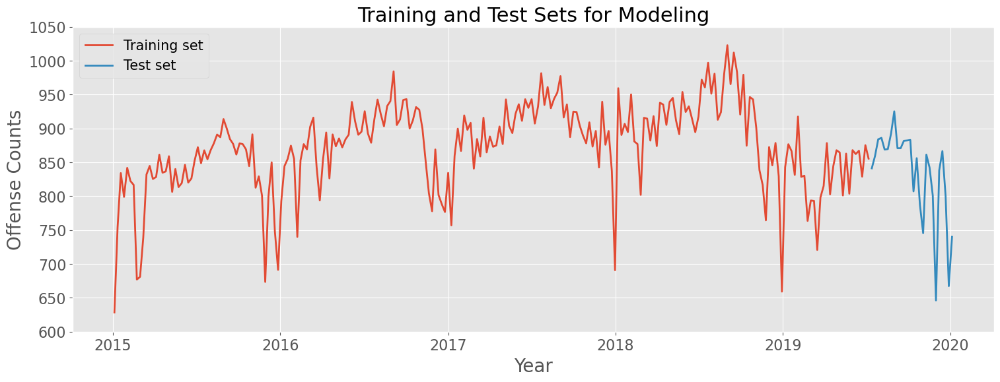

In [8]:
with open('images/pickled_figs/ts_weekly_train_test.pickle', 'rb') as f:
    fig=pickle.load(f)
fig

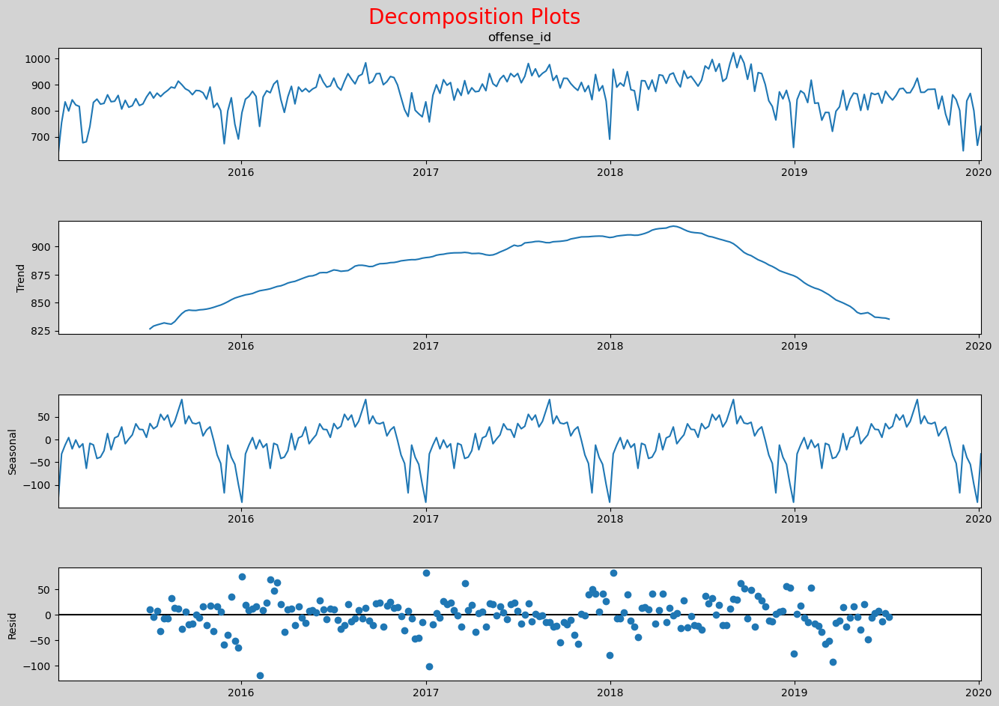

In [9]:
with open('images/pickled_figs/decomposition_plot_ts_weekly.pickle', 'rb') as f:
    fig=pickle.load(f)
                     
fig;

<br><br><span style="font-size:1.2em;">The time-series clearly displays a trend and a seasonality components. The crime rate increases in the middle of a year and drops in cold months of a year especially noticeably around Thanksgiving and Christmas holidays.</span><br><br>

# Model&iNterpret

## Modeling of General Crime Rate

<span style="font-size:1.2em;">I have decided to build n ARIMA(3, 1, 0) model with only trend autocorrelation components and first differencing as a Baseline model. As expected, the model performed relatively well, picking up an average trend for the last year but failed to account for seasonality.</span><br><br>

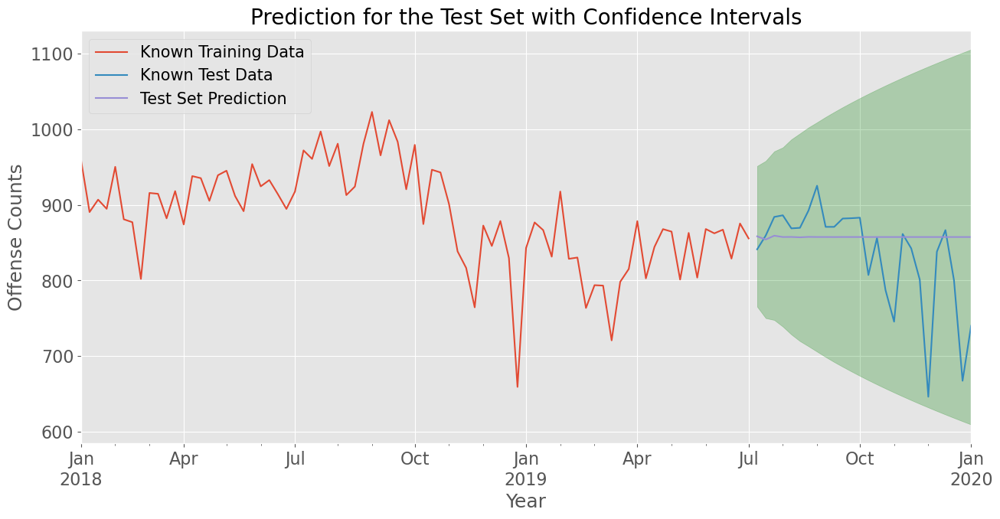

In [10]:
with open('images/pickled_figs/arima_train_test.pickle', 'rb') as f:
    fig=pickle.load(f)

fig    

<br><br><span style="font-size:1.2em;">Gridsearch for the best SARIMAX model suggested ARIMA(3, 1, 0)x(3, 1, 0, 52) combination that generated relatively good test results and a reasonable forecast for two years forward.</span><br><br>

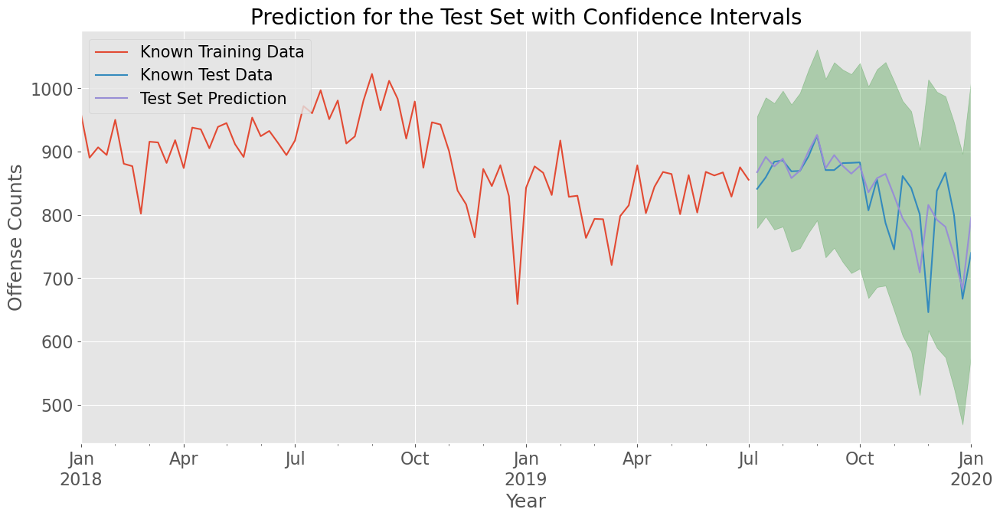

In [11]:
with open('images/pickled_figs/sarimax_mod1_train_test.pickle', 'rb') as f:
    fig=pickle.load(f)

fig    

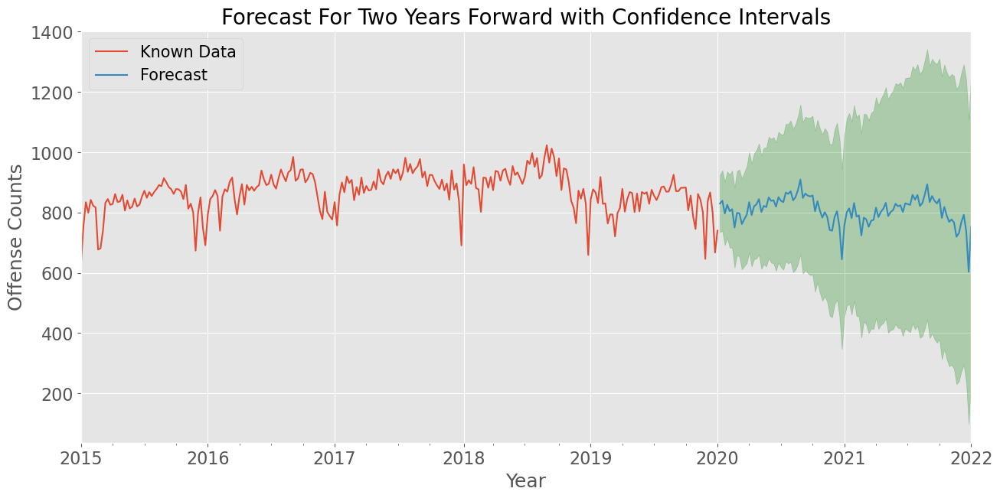

In [12]:
with open('images/pickled_figs/sarimax_mod1_forecast.pickle', 'rb') as f:
    fig=pickle.load(f)
    
fig    

<br><br><span style="font-size:1.2em;">Based on the fact that the crime rate seemingly had downturns around holiday season I included exogenous predictors (US holiday time-series) into the mode. However, I used the same best combination from the previous gridsearch of ARIMA(3, 1, 0)x(3, 1, 0, 52). The results of the testing and forecasting were virtually the same.</span><br><br>

<span style="font-size:1.2em;">The last step in the modeling of the general crime rate was using an auto-arima approach to search for the best combination of p,d,q and P,D,Q,d for ten and seasonal components of the time-series. The best model generated was a SARIMAX(1, 1, 1)x(2, 1, 0, 52) model. It displayed a relatively good fit with the test data and a </span><br><br>

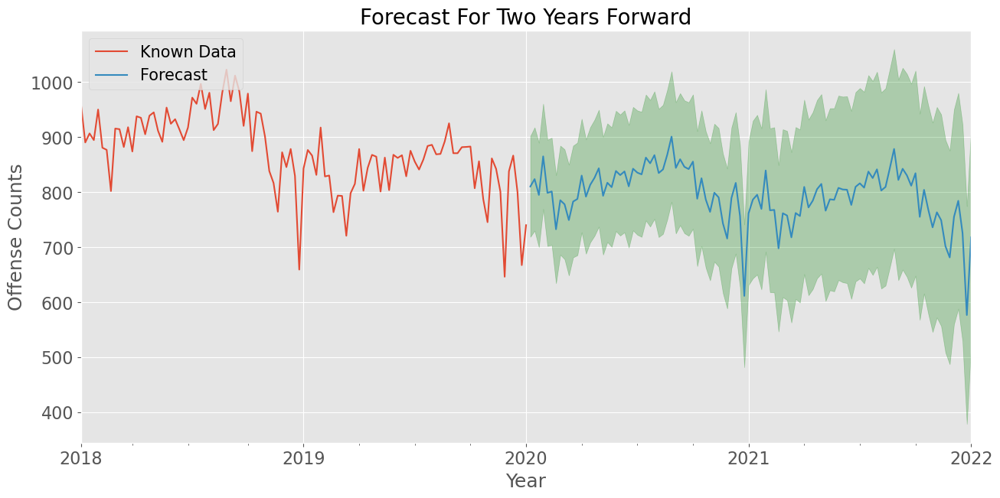

In [13]:
with open('images/pickled_figs/auto_arima_forecast.pickle', 'rb') as f:
    fig=pickle.load(f)
    
fig    

## Modeling of Crime Rate per Category

<span style="font-size:1.2em;">There are 23 separate crime categories in the original dataset. Some of them have sub-categories. But it has been decided to limit the analysis only to categories level.</span><br><br>

<span style="font-size:1.2em;">Various categories demonstrated significantly different stationarity, trend and seasonality characteristics. All categories were modeled using auto-arima grid search, tested, and two-year forecast for each category generated. The final result can be found in the saved pickle files at data/pickled_models/RESULTS1 and RESULTS2. Each file contains a category model along with a forecast plot. Due to the sheer volume of the data it's better to see the corresponding [notebook](capstone_project_part4.ipynb)</span><br><br>

# Conclusions

<span style="font-size:1.2em;">&ensp;&ensp;&ensp;&ensp;1.&ensp;&ensp;The project demonstrated that the real crime data could be analyzed and modeled with significant accuracy.<br>
&ensp;&ensp;&ensp;&ensp;2.&ensp;&ensp;It also demonstrated that the generated models could well predict future general crime rates and categories crime rates.<br>
&ensp;&ensp;&ensp;&ensp;3.&ensp;&ensp;The Exploratory Data Analysis depicted which geographic areas show higher crime rates and require more resources and preventive programs.<br>
&ensp;&ensp;&ensp;&ensp;4.&ensp;&ensp;The dataset, results of EDA, and the models are the base for a web-based dashboard built with dash python package.</span><br><br>

# Recommendations

<span style="font-size:1.2em;">&ensp;&ensp;&ensp;&ensp;1.&ensp;&ensp;Obtain current data; isn't easy to forecast future trends with data almost two years old
<br>
&ensp;&ensp;&ensp;&ensp;2.&ensp;&ensp;Suppose dynamic data becomes available, build an API. This approach would be the most helpful to the general public
<br>
&ensp;&ensp;&ensp;&ensp;3.&ensp;&ensp;Add exogenous predictors to the time-series to improve modeling performance. The most helpful predictors would be:
<br>
&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;a.&ensp;&ensp;Socio-economic features of the geographic areas<br>
&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;Median Income<br>
&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;ii.&ensp;&ensp;Population Distribution between Racial and Ethnic groups<br>
&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;iii.&ensp;&ensp;Population Distribution between Age groups<br>
&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;iii.&ensp;&ensp;Unemployment Level<br>
&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;b.&ensp;&ensp;Additional offenders’ and victims’ demographics<br>
&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;i.&ensp;&ensp;Income<br>
&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;ii.&ensp;&ensp;Education<br>
&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;iii.&ensp;&ensp;Family Status<br>
&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;c.&ensp;&ensp;Information about local crime prevention measures and policies<br>
&ensp;&ensp;&ensp;&ensp;4.&ensp;&ensp;Add geographic locations of committed offenses to improve knowledge of most crime-prone areas to plan for resources and preventive measures.<br>
&ensp;&ensp;&ensp;&ensp;5.&ensp;&ensp;Improve performance and quality of the web-based 'Crime in Colorado' application.</span><br><br>
